# <center> <font style="color:rgb(100,109,254)"> Neural Style Transfer</font> </center>


Most of you have probably used apps like Prisma, where you can transform a photo from your camera to look like a cool artistic painting. 

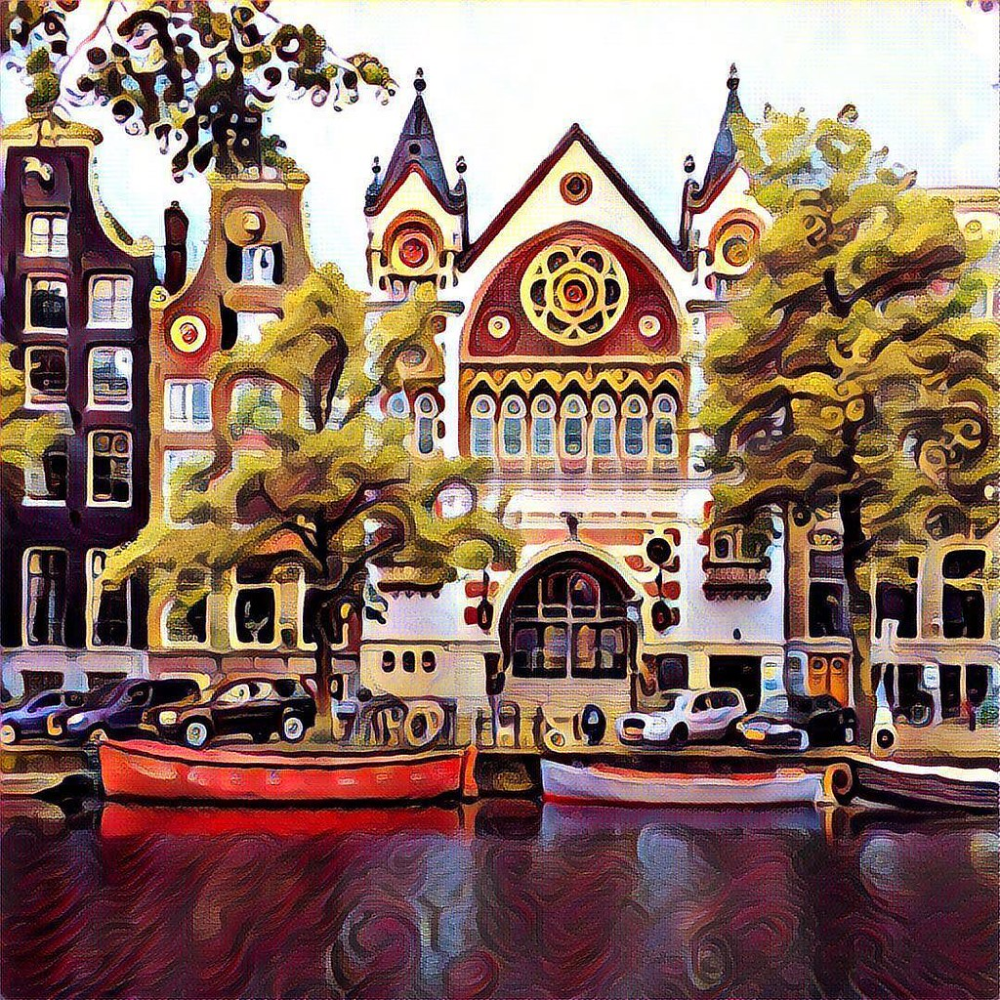

This is actually possible using a deep learning technique called Neural Style transfer. With this technique you take a normal image (content image) and another reference image (this is called a style image, its usually a painting or an artistic work) and then during training we blend the content image with the style image in such a way that it retains its original content but gets the style of the style image, in other words it looks like that the content image is painted in the same image as the style image.

<center><h2>Using Style Image</h2></center>

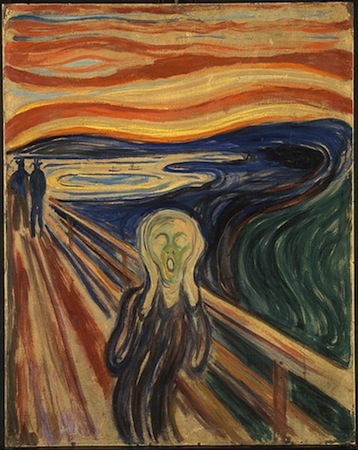


<center><h2>Modified Content Image</h2></center>

![alt](Media/M4/styled1.png)

This algorithm was introduced by  Gatys et al. in his paper [A Neural Algorithm of Artistic Style](https://arxiv.org/pdf/1508.06576.pdf) where he introduced how you could get these awesome styles using convolutional networks.

Now today we're not going to use the original algorithm as the way its configured, its pretty slow. So we're going to use [Johnson et al](https://cs.stanford.edu/people/jcjohns/eccv16/). implementation which is built on Gatys work. This approach is about 3x faster. The biggest downside to this approach is that you cannot arbitrarily select a style image and apply it on a content image with Johnson's method.

Instead, you first need to train a network and make it learn to reproduce the style of your desired style image on its own. Once the network is fully trained, you can then use this network to apply it to any content image you want. 

In [ ]:
# Import Required libraries
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
from tkinter import filedialog
from tkinter import Tk
import os
%matplotlib inline


##  <font style="color:rgb(134,19,348)">Select Model Path</font> 

In [ ]:
#model ='Media/M4/Model/style-model/feathers.t7'
model ='Media/M4/Model/style-model/candy.t7'
#model ='Media/M4/Model/style-model/composition_vii.t7'
#model ='Media/M4/Model/style-model/udnie.t7'
#model ='Media/M4/Model/style-model/the_wave.t7'
#model ='Media/M4/Model/style-model/the_scream.t7'
#model ='Media/M4/Model/style-model/mosaic.t7'
#model ='Media/M4/Model/style-model/la_muse.t7'
#model ='Media/M4/Model/style-model/starry_night.t7'

## <font style="color:rgb(134,19,348)"> Initialize the DNN module </font>

In [ ]:
# loading the neural style model from disk
net = cv2.dnn.readNetFromTorch(model)

##  <font style="color:rgb(134,19,348)">Read Image</font> 


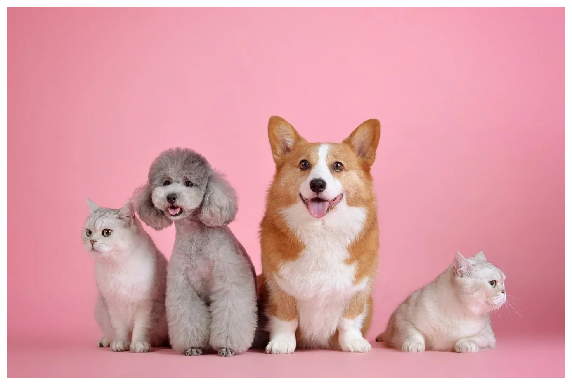

In [7]:
# Read image
image = cv2.imread("Media/M4/1.png")

# Display image
plt.figure(figsize=[10,10])
plt.imshow(image[:,:,::-1])
plt.axis('off');

##  <font style="color:rgb(134,19,348)"> Pre-processing the image 
</font>

In [8]:
# Define RGB value for mean subtraction, these are the values that were subtracted from channels during training.
R,G,B = 103.939, 116.779, 123.680

# Prepare the frame to be fed to the network
blob = cv2.dnn.blobFromImage(image, 1.0, (image.shape[1], image.shape[0]),(R,G,B), swapRB=False)

##  <font style="color:rgb(134,19,348)">Forward Pass</font> 


In [10]:
%%time
net.setInput(blob)
output = net.forward()

Wall time: 2.18 s


In [11]:
print(output.shape)

(1, 3, 900, 1352)


##  <font style="color:rgb(134,19,348)">PostProcessing</font> 
In the postprocessing step we undo all the things that was done in the preprocessing stage. 

In [13]:
# Reshaping the output
final_output = output.reshape((3, output.shape[2], output.shape[3])).copy()


# Add all mean values back which we subracted earlier
final_output[0] += R
final_output[1] += G
final_output[2] += B

In [14]:
# Reformat the image.

final_output = final_output.transpose(1, 2, 0)
print('Final Image: {}'.format(final_output.shape))

Final Image: (900, 1352, 3)


In [15]:
# Here we are clipping all values below or above  0 , 255 
outmid = np.clip(final_output, 0, 255)

# Convert the datatype back to uint8
styled = outmid.astype('uint8')

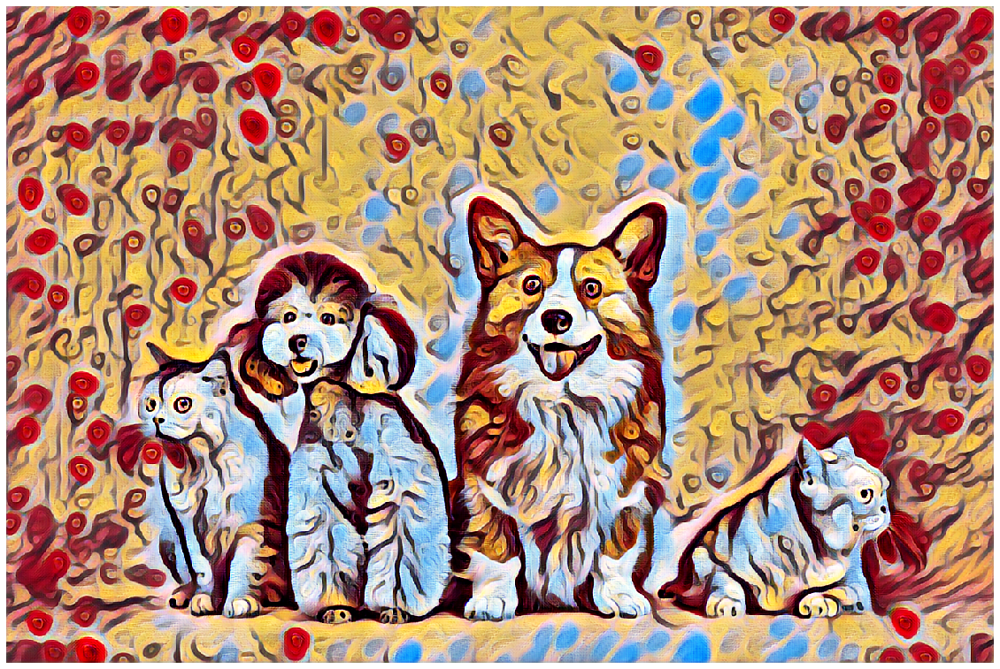

In [16]:
plt.figure(figsize=(20,20))
plt.imshow(styled[:,:,::-1]);plt.axis("off");

## <font style="color:rgb(134,19,348)"> Creating Functions </font> 
Now that we have understood step by step how to create the pipeline for Neural Style Transfer using OpenCV's DNN module, we'll now create functions that do all the above in a single step.

## <font style="color:rgb(134,19,348)"> Initialization Function </font>
This method will be run once and it will initialize the network with the required files.

In [17]:
# Define Model name
model_name= ['feathers', 'candy', 'composition_vii', 'udnie', 'the_wave', 'the_scream', 'mosaic', 'la_muse', 'starry_night']

def init_style_transfer(style="candy",usegpu = 'None'):
    global net
    if style in model_name:
        model ='Media/M4/Model/style-model/'+style+".t7" 
        net = cv2.dnn.readNetFromTorch(model)
        # If specified use either cuda based Nvidia gpu or opencl based Intel gpu.   
        if usegpu == 'cuda':
            net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
            net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

        elif usegpu == 'opencl':
            net.setPreferableTarget(cv2.dnn.DNN_TARGET_OPENCL)    

## <font style="color:rgb(134,19,348)">Main Method </font>

In [18]:
def style_tranfer(image=[], usercam=False,returndata=False):
    if np.size(image) == 0:
        
        # If usercam cam is True then take picture from camera
        if usercam:
            cap=cv2.VideoCapture(0, cv2.CAP_DSHOW)
            ret, frame=cap.read()
            if ret:
                image= cv2.flip(frame,1)
                cap.release()
            else:
                print('Cant Open Camera')
                sys.exit()
                
        # Otherwise select image from computer using tkinter        
        else:
            root = Tk()
            root.filename =  filedialog.askopenfilename(title = "Pick up the Image")
            root.withdraw()
            image = cv2.imread(root.filename)
    R,G,B = 103.939, 116.779, 123.680
    blob = cv2.dnn.blobFromImage(image, 1.0, (image.shape[1], image.shape[0]),(R,G,B), swapRB=False, crop=False)
    net.setInput(blob)
    output = net.forward()
    final_output = output.reshape((3, output.shape[2], output.shape[3])).copy()
    final_output[0] += R
    final_output[1] += G
    final_output[2] += B
    final_output = final_output.transpose(1, 2, 0)
    outmid = np.clip(final_output, 0, 255)
    styled= outmid.astype('uint8')
    
    if  returndata:           
        return styled
    else:
        plt.figure(figsize=(20,20))
        plt.imshow(styled[:,:,::-1]);plt.axis("off");

**Initialize the Styled model with la_muse Model**

In [19]:
init_style_transfer()

***Applying Style model***

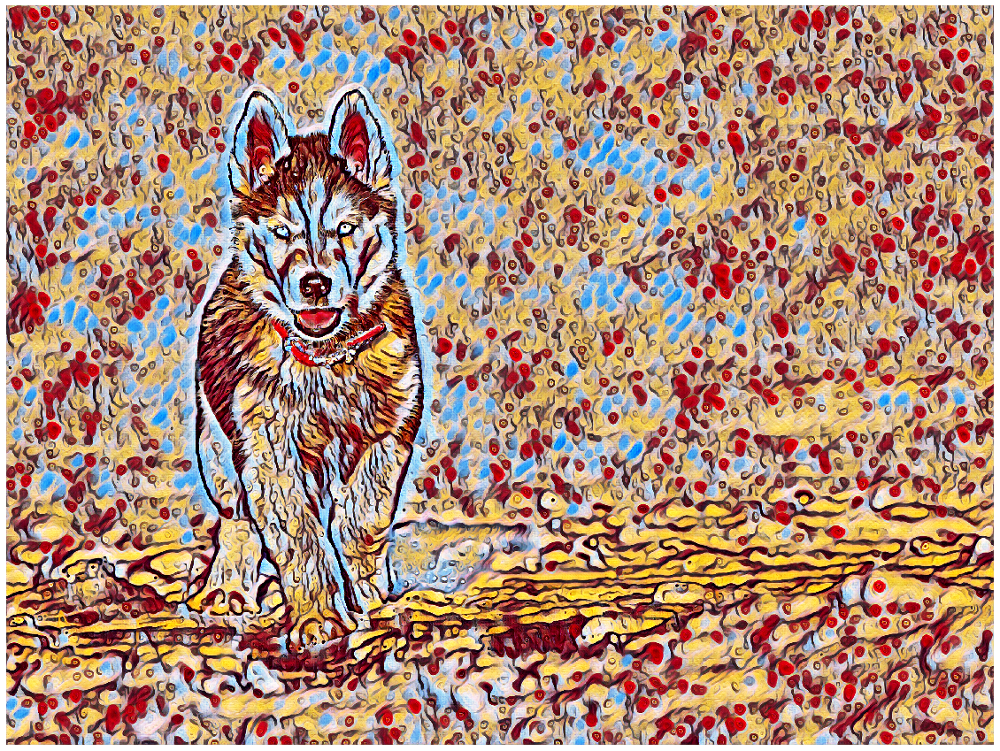

In [20]:
image = cv2.imread("Media/M4/dog.jpeg")
style_tranfer(image)

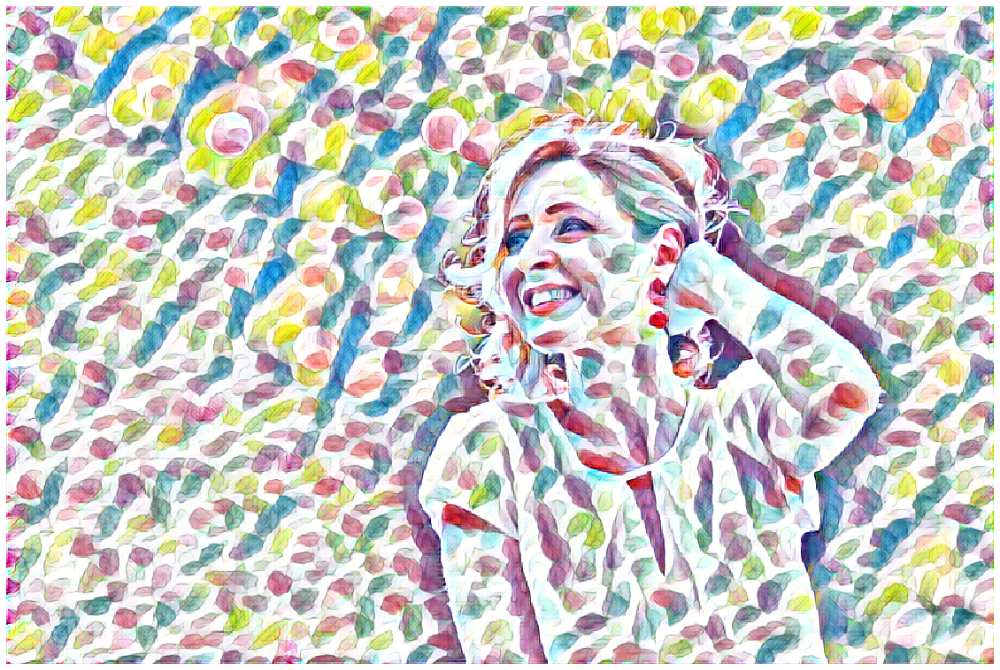

In [21]:
init_style_transfer("feathers")
image = cv2.imread("Media/M4/female1.jpg")
style_tranfer(image)

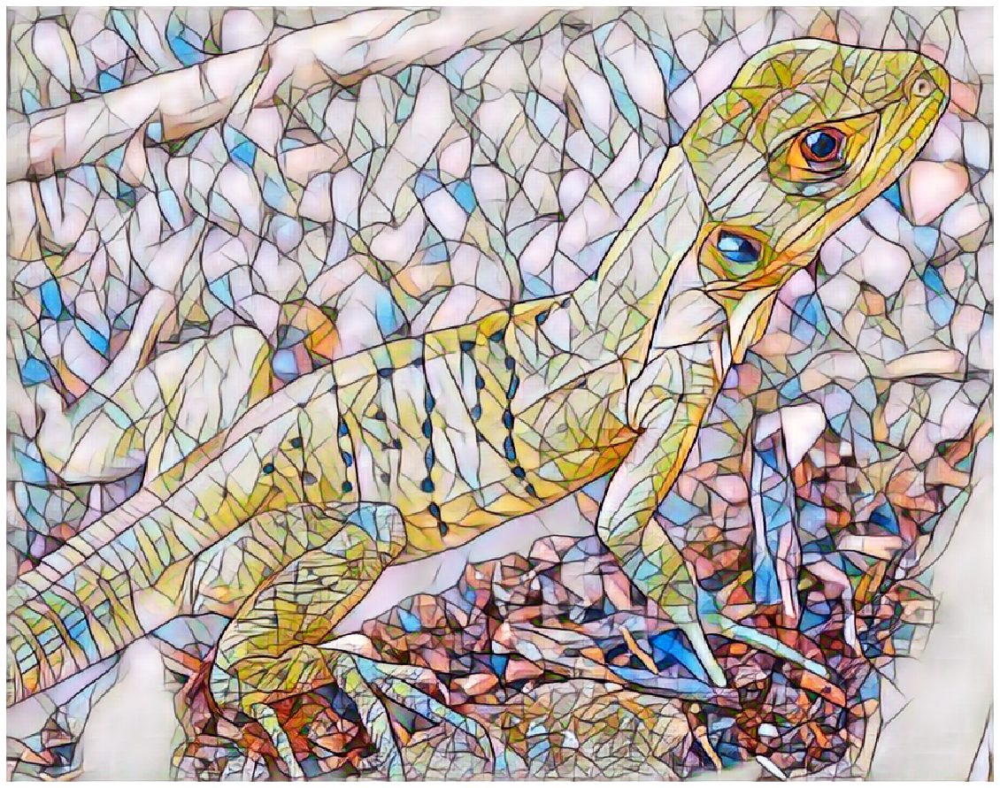

In [22]:
init_style_transfer("mosaic")
image = cv2.imread("Media/M4/green_lizard.jpg")
style_tranfer(image)

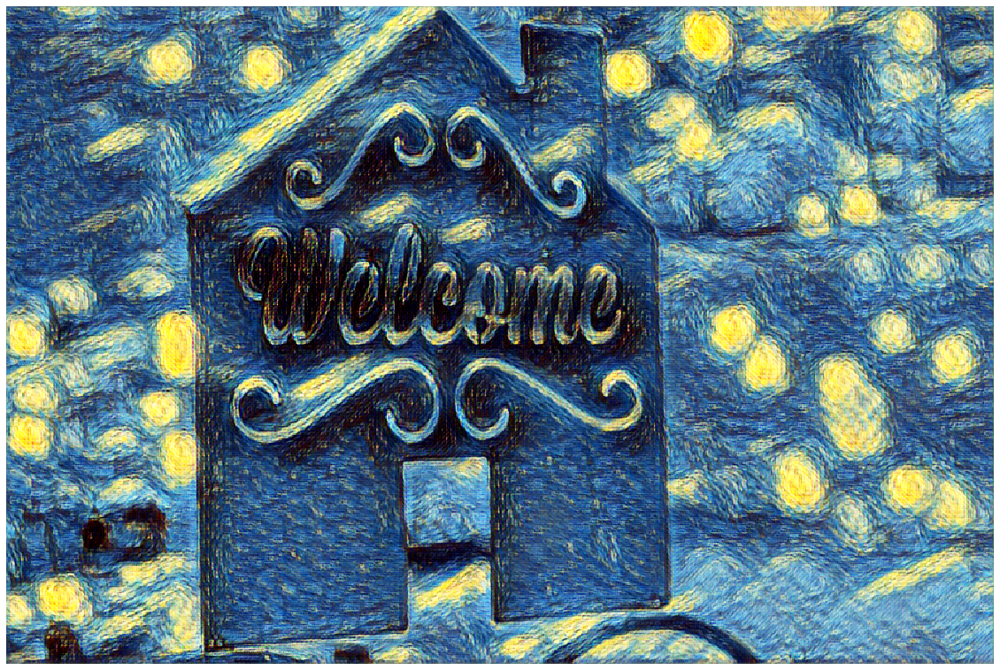

In [23]:
init_style_transfer("starry_night")
image = cv2.imread("Media/M4/txt2.jpg")
style_tranfer(image)

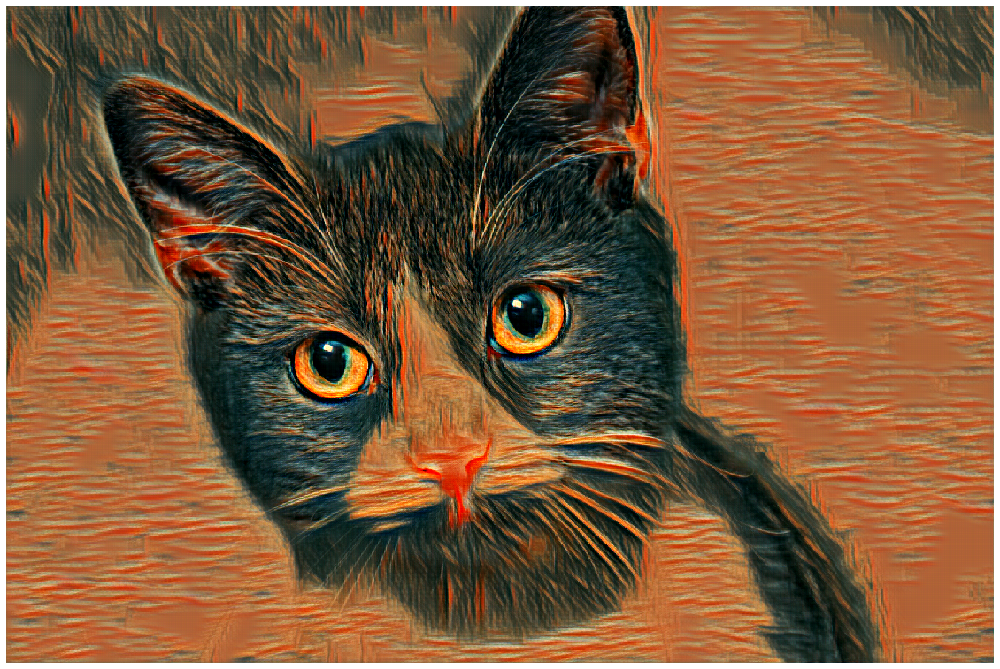

In [24]:
init_style_transfer("the_scream")
img1 = cv2.imread("Media/M4/cat.jpeg")
style_tranfer(img1)

##  <font style="color:rgb(134,19,348)">Iterate Over all Styles on one image</font> 


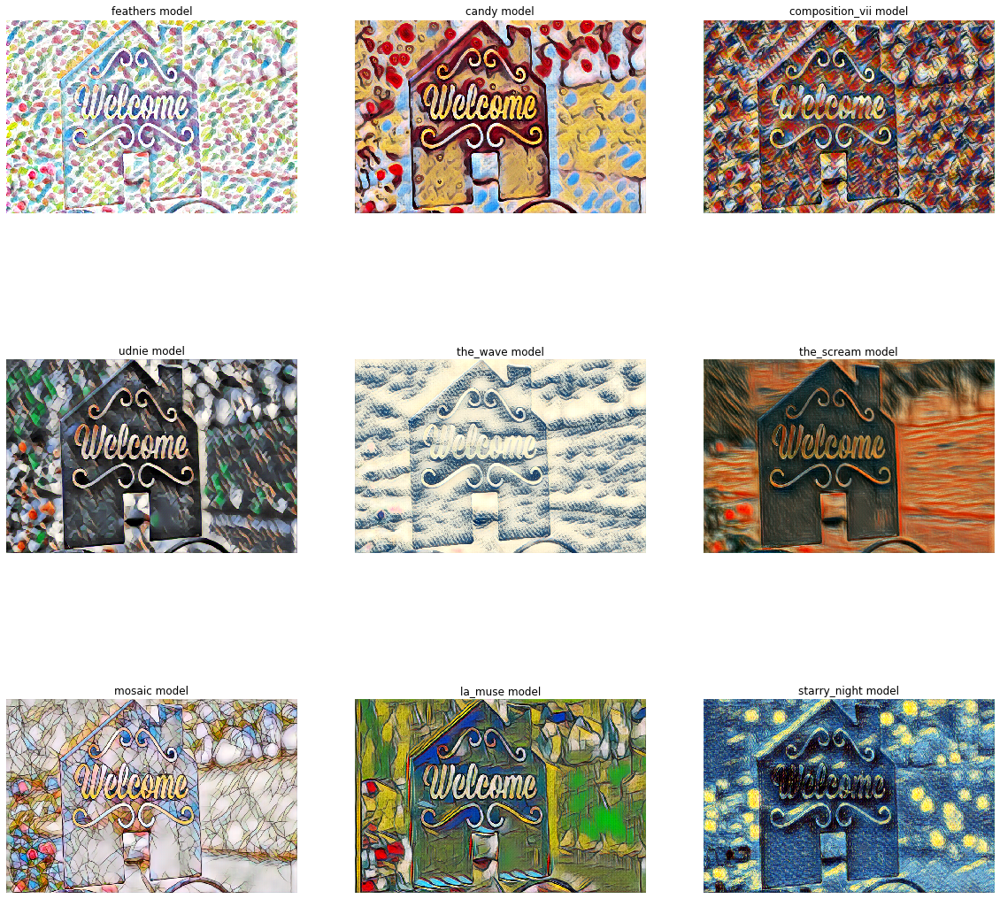

In [25]:
# Defining rows and columns
rows = 3

# Define Figure Size
plt.figure(figsize=(20,20));

# Show all points with prob map
for i,model in enumerate(model_name):
    init_style_transfer(model)
    styled = style_tranfer(image,returndata=True);
    plt.subplot(rows, 3,i+1);plt.imshow(styled[:,:,::-1]);plt.title(model + " model");plt.axis("off") 

####  Capturing Image from Camera also change the style

In [ ]:
init_style_transfer("la_muse")
style_tranfer(usercam=True)

## <font style="color:rgb(134,19,348)"> Using Intel & Nvidia GPUs </font>

**CPU Time**

In [ ]:
init_style_transfer()

In [ ]:
%%time
image= style_tranfer(image = image, returndata=True)

**Intel GPU**

In [ ]:
init_style_transfer(usegpu = 'opencl')

In [ ]:
%%time
image= style_tranfer(image = image, returndata=True)

**NVIDIA GPU**

In [ ]:
init_style_transfer(usegpu = 'cuda')

In [ ]:
%%time
image= style_tranfer(image = image, returndata=True)

## <font style="color:rgb(134,19,348)">Style Transfer On Video</font>

In [ ]:
# Initializing method
init_style_transfer()

# Starting video reading mode
cap = cv2.VideoCapture('Media/M4/dpose1.mp4')
fourcc = cv2.VideoWriter_fourcc(*'XVID')

# Specifying Video writing path
out = cv2.VideoWriter(r'Media/M4/styled.mp4',fourcc, 20.0, (700,500))

while(True):
    
    ret, frame = cap.read()
    if not ret:
        break
        
    styled = style_tranfer(frame,returndata=True)
    
    cv2.imshow('Styled Video',styled)
    out.write(styled)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
cap.release()
out.release()
cv2.destroyAllWindows()